In [39]:
# Cell 1 — Setup
from pathlib import Path
import json, random, hashlib
from collections import defaultdict

import numpy as np
import pandas as pd
import cv2
from PIL import Image
import matplotlib.pyplot as plt

SEED = 42
random.seed(SEED)
np.random.seed(SEED)

PROJECT_ROOT = Path("/homes/mxqasim/Chocolathon")

# Inputs
SYNTH_MANIFEST    = PROJECT_ROOT / "data/synthetic_slots/v1/dataset/synthetic_slot_manifest.csv"
EMPTY_SLOT_MANIF  = PROJECT_ROOT / "data/boxes/slots/empty_slots_manifest.csv"
BOX_MANIFEST      = PROJECT_ROOT / "data/boxes/manifest.csv"
BOX_RAW_DIR       = PROJECT_ROOT / "data/boxes/raw"

# Outputs
OUT_ROOT     = PROJECT_ROOT / "data/synthetic_filled_boxes/v1"
OUT_IMAGES   = OUT_ROOT / "images"
OUT_META     = OUT_ROOT / "metadata"
OUT_MANIFEST = OUT_ROOT / "manifest.csv"
OUT_MANIFEST.parent.mkdir(parents=True, exist_ok=True)
OUT_IMAGES.mkdir(parents=True, exist_ok=True)
OUT_META.mkdir(parents=True, exist_ok=True)

LAYOUTS = {6: (3, 2), 16: (4, 4), 30: (6, 5), 50: (10, 5)}
CORNER_NAMES = ("top_left", "top_right", "bottom_right", "bottom_left")
CELL = 320   # tray cell size used when stitching; higher = sharper un-warp

for p in [SYNTH_MANIFEST, EMPTY_SLOT_MANIF, BOX_MANIFEST, BOX_RAW_DIR]:
    print(f"{'OK' if p.exists() else 'MISSING':>7}  {p}")
print("Output root:", OUT_ROOT)

     OK  /homes/mxqasim/Chocolathon/data/synthetic_slots/v1/dataset/synthetic_slot_manifest.csv
     OK  /homes/mxqasim/Chocolathon/data/boxes/slots/empty_slots_manifest.csv
     OK  /homes/mxqasim/Chocolathon/data/boxes/manifest.csv
     OK  /homes/mxqasim/Chocolathon/data/boxes/raw
Output root: /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v1


In [1]:
# Cell 2 — Load, filter and inspect manifests
synth = pd.read_csv(SYNTH_MANIFEST)
empty = pd.read_csv(EMPTY_SLOT_MANIF)
boxes = pd.read_csv(BOX_MANIFEST)

print("Synthetic samples before filtering:", len(synth))

# Keep only occupied chocolate samples for completely filled boxes
synth["flavor_id"] = synth["flavor_id"].astype(str).str.strip()
occupied_mask = synth["flavor_id"].str.lower().ne("empty")

if "label_type" in synth.columns:
    synth["label_type"] = synth["label_type"].astype(str).str.strip().str.lower()
    occupied_mask &= synth["label_type"].eq("occupied")

removed_count = int((~occupied_mask).sum())
synth = synth.loc[occupied_mask].copy().reset_index(drop=True)

print("Synthetic samples after filtering:", len(synth))
print("Removed empty samples:", removed_count)

assert not synth["flavor_id"].str.lower().eq("empty").any()

if "label_type" in synth.columns:
    assert synth["label_type"].eq("occupied").all()

print("\nSynthetic slot manifest:", synth.shape)
print("  columns:", synth.columns.tolist())

print("\nEmpty slot manifest:", empty.shape)
print("  columns:", empty.columns.tolist())

print("\nBox manifest:", boxes.shape)
print("  columns:", boxes.columns.tolist())

# Resolve absolute synthetic-slot paths
synth["image_path"] = synth["relative_path"].map(
    lambda p: str(PROJECT_ROOT / p)
)

missing = synth.loc[
    ~synth["image_path"].map(lambda p: Path(p).exists())
]

print("\nMissing synthetic slot images:", len(missing))

# Check raw box images
raw_files = sorted(
    p.name
    for p in BOX_RAW_DIR.glob("*")
    if p.suffix.lower() in {".jpg", ".jpeg", ".png"}
)

print("Raw box images found:", len(raw_files))
print("  e.g.:", raw_files[:5])

display(synth.head(3))
display(boxes.head(3))

NameError: name 'pd' is not defined

In [41]:
# Cell 2.5 — Inspect one grid annotation to confirm keys
import json
sample_grid_path = empty["grid_annotation"].iloc[0]
print("Sample grid annotation:", sample_grid_path)
with open(sample_grid_path) as f:
    gj = json.load(f)
print("Top-level keys:", list(gj.keys()))
print(json.dumps({k: gj[k] for k in list(gj.keys())[:6]}, indent=2)[:1200])

Sample grid annotation: /homes/mxqasim/Chocolathon/data/boxes/grid_annotations/IMG_2019.json
Top-level keys: ['file', 'box_size', 'rows', 'columns', 'anchors']
{
  "file": "IMG_2019.jpg",
  "box_size": 6,
  "rows": 3,
  "columns": 2,
  "anchors": {
    "top_left": [
      85.0,
      174.0
    ],
    "top_right": [
      299.0,
      178.0
    ],
    "bottom_right": [
      300.0,
      600.0
    ],
    "bottom_left": [
      95.0,
      601.0
    ]
  }
}


In [42]:
# Cell 3 (replacement v4) — end-to-end filled-box builder
def grid_corners_in_camera(grid: dict,
                           camera_wh: tuple[int, int],
                           annotation_wh: tuple[int, int]) -> np.ndarray:
    """Scale anchors from annotation space to camera space."""
    anchors = grid.get("anchors") or grid.get("corners") or grid
    pts = np.array([anchors[k] for k in CORNER_NAMES], np.float32)
    sx = camera_wh[0] / annotation_wh[0]
    sy = camera_wh[1] / annotation_wh[1]
    return pts * np.array([sx, sy], np.float32)


def build_filled_box(box_row: pd.Series,
                     slots_for_box: pd.DataFrame,
                     out_path: Path,
                     empty_lookup: dict,
                     row_off: int,
                     col_off: int,
                     jpeg_quality: int = 92) -> dict:
    src = box_row["file"]
    box_size = int(box_row["box_size"])
    raw_path = BOX_RAW_DIR / src
    raw_rgb = np.asarray(Image.open(raw_path).convert("RGB"))
    H, W = raw_rgb.shape[:2]

    ann_wh = get_annotation_wh(box_row)
    grid = load_grid_annotation(box_row["grid_annotation_file"])
    corners_cam = grid_corners_in_camera(grid, (W, H), ann_wh)

    tray, placed = stitch_tray(slots_for_box, box_size, empty_lookup, row_off, col_off)
    warped, mask = unwarp_to_camera(tray, corners_cam, (W, H))
    filled = composite_onto_camera(raw_rgb, warped, mask)

    out_path.parent.mkdir(parents=True, exist_ok=True)
    Image.fromarray(filled).save(out_path, quality=jpeg_quality)

    return {
        "source_file": src,
        "box_size": box_size,
        "image": str(out_path),
        "camera_w": W,
        "camera_h": H,
        "annotation_w": ann_wh[0],
        "annotation_h": ann_wh[1],
        "corners_cam": corners_cam.tolist(),
        "grid_path": box_row["grid_annotation_file"],
        "n_slots": LAYOUTS[box_size][0] * LAYOUTS[box_size][1],
        "n_filled": len(placed),
        "filled_positions": sorted(list(placed.keys())),
        "sample_ids": [p["sample_id"] for p in placed.values()],
        "flavor_ids": [p["flavor_id"] for p in placed.values()],
    }


print("build_filled_box v4 ready.")

build_filled_box v4 ready.


In [43]:
# Cell 3.5 — Diagnose coordinate spaces
import json
from PIL import Image

# Take a box and check all three resolutions
row = boxes.iloc[0]
print("Box:", row["file"])
print("  normalized_file:", row["normalized_file"])
print("  grid_annotation_file:", row["grid_annotation_file"])
print("  raw:", BOX_RAW_DIR / row["file"])

for label, p in [("raw",          BOX_RAW_DIR / row["file"]),
                 ("normalized",   Path(row["normalized_file"])),
                 ("grid",         Path(row["grid_annotation_file"]))]:
    if p.exists():
        if p.suffix.lower() == ".json":
            gj = json.loads(p.read_text())
            anchors = np.array([gj["anchors"][k] for k in ("top_left","top_right","bottom_right","bottom_left")])
            print(f"  {label:11s}: {p.name}")
            print(f"             anchor range x:[{anchors[:,0].min():.1f},{anchors[:,0].max():.1f}] "
                  f"y:[{anchors[:,1].min():.1f},{anchors[:,1].max():.1f}]")
        else:
            with Image.open(p) as im:
                print(f"  {label:11s}: {p.name}  size={im.size}")
    else:
        print(f"  {label:11s}: MISSING ({p})")

# Do this for all boxes to confirm the pattern
print("\nPer-box resolution table:")
rows = []
for _, b in boxes.iterrows():
    with Image.open(BOX_RAW_DIR / b["file"]) as im:
        raw_wh = im.size
    norm_wh = None
    if Path(b["normalized_file"]).exists():
        with Image.open(b["normalized_file"]) as im:
            norm_wh = im.size
    rows.append({"file": b["file"], "box_size": b["box_size"],
                 "raw_wh": raw_wh, "norm_wh": norm_wh})
res_df = pd.DataFrame(rows)
display(res_df)

Box: IMG_2019.jpg
  normalized_file: /homes/mxqasim/Chocolathon/data/boxes/normalized/IMG_2019.jpg
  grid_annotation_file: /homes/mxqasim/Chocolathon/data/boxes/grid_annotations/IMG_2019.json
  raw: /homes/mxqasim/Chocolathon/data/boxes/raw/IMG_2019.jpg
  raw        : IMG_2019.jpg  size=(3024, 4032)
  normalized : IMG_2019.jpg  size=(512, 768)
  grid       : IMG_2019.json
             anchor range x:[85.0,300.0] y:[174.0,601.0]

Per-box resolution table:


,file,box_size,raw_wh,norm_wh
0,IMG_2019.jpg,6,"(3024, 4032)","(512, 768)"
1,IMG_2020.jpg,6,"(3024, 4032)","(512, 768)"
2,IMG_2021.jpg,6,"(3024, 4032)","(512, 768)"
3,IMG_2022.jpg,16,"(3024, 4032)","(1024, 1024)"
4,IMG_2023.jpg,16,"(3024, 4032)","(1024, 1024)"
5,IMG_2024.jpg,16,"(3024, 4032)","(1024, 1024)"
6,IMG_2025.jpg,16,"(3024, 4032)","(1024, 1024)"
7,IMG_2026.jpg,16,"(3024, 4032)","(1024, 1024)"
8,IMG_2027.jpg,30,"(3024, 4032)","(1280, 1536)"
9,IMG_2028.jpg,30,"(3024, 4032)","(1280, 1536)"


In [44]:
# Cell 4 — Helper functions used by build_filled_box
import json
import numpy as np
import cv2
from pathlib import Path
from PIL import Image


def load_grid_annotation(path: str) -> dict:
    with open(path) as f:
        return json.load(f)


def get_annotation_wh(box_row: pd.Series) -> tuple[int, int]:
    """The (W, H) coordinate space that grid anchors live in.
    Grid anchors in this dataset are drawn on the *normalized* image."""
    norm = box_row.get("normalized_file")
    if norm and Path(norm).exists():
        with Image.open(norm) as im:
            return im.size
    raise FileNotFoundError(f"Cannot determine annotation size for {box_row['file']}")


# Cell 4 (replacement) — alpha-aware stitch_tray
def _load_slot_rgba(path: str) -> tuple[np.ndarray, np.ndarray] | None:
    """Return (BGR, alpha) for a synthetic slot image. alpha=255 if opaque."""
    img = cv2.imread(str(path), cv2.IMREAD_UNCHANGED)
    if img is None:
        return None
    if img.ndim == 2:
        return cv2.cvtColor(img, cv2.COLOR_GRAY2BGR), np.full(img.shape, 255, np.uint8)
    if img.shape[2] == 3:
        return img, np.full(img.shape[:2], 255, np.uint8)
    if img.shape[2] == 4:
        return img[:, :, :3], img[:, :, 3]
    return None


def stitch_tray(slots_for_box: pd.DataFrame,
                box_size: int,
                empty_lookup: dict,
                row_off: int,
                col_off: int,
                cell: int = CELL,
                tray_bg: tuple[int, int, int] = (28, 28, 28)  # BGR dark plastic
                ) -> tuple[np.ndarray, dict]:
    """Place rectified synthetic slot crops into a rows×cols tray canvas.

    - Loads with alpha (RGBA PNGs are handled correctly).
    - Initializes the tray with a dark plastic color (not pure black),
      so gaps between pasted slots look like the tray, not a void.
    """
    rows, cols = LAYOUTS[box_size]
    tray = np.full((rows * cell, cols * cell, 3), tray_bg, dtype=np.uint8)
    placed: dict = {}

    for _, s in slots_for_box.iterrows():
        slot_file = s["empty_slot_file"]
        if slot_file not in empty_lookup:
            continue
        r, c = empty_lookup[slot_file]
        rr, cc = int(r) - row_off, int(c) - col_off
        if not (0 <= rr < rows and 0 <= cc < cols):
            continue

        loaded = _load_slot_rgba(s["image_path"])
        if loaded is None:
            continue
        bgr, alpha = loaded

        bgr = cv2.resize(bgr, (cell, cell), interpolation=cv2.INTER_AREA)
        alpha = cv2.resize(alpha, (cell, cell), interpolation=cv2.INTER_AREA)

        y0, x0 = rr * cell, cc * cell
        roi = tray[y0:y0 + cell, x0:x0 + cell].astype(np.float32)
        fg = bgr.astype(np.float32)
        a = (alpha.astype(np.float32) / 255.0)[..., None]
        tray[y0:y0 + cell, x0:x0 + cell] = np.clip(
            fg * a + roi * (1.0 - a), 0, 255
        ).astype(np.uint8)

        placed[(rr, cc)] = s

    return tray, placed

def unwarp_to_camera(tray: np.ndarray,
                     corners_cam: np.ndarray,
                     camera_wh: tuple[int, int]) -> tuple[np.ndarray, np.ndarray]:
    """Perspective-warp the rectified tray to the camera-frame tray corners."""
    h, w = tray.shape[:2]
    src = np.float32([[0, 0], [w - 1, 0], [w - 1, h - 1], [0, h - 1]])  # TL TR BR BL
    dst = corners_cam.astype(np.float32)

    M = cv2.getPerspectiveTransform(src, dst)
    W, H = camera_wh

    warped = cv2.warpPerspective(
        tray, M, (W, H),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT, borderValue=(0, 0, 0),
    )
    mask = np.full((h, w), 255, dtype=np.uint8)
    mask_w = cv2.warpPerspective(mask, M, (W, H), flags=cv2.INTER_NEAREST)

    # Erode the mask a bit so warped tray edges don't bleed over the real box edges
    mask_w = cv2.erode(mask_w, np.ones((5, 5), np.uint8), iterations=1)
    return warped, mask_w


def composite_onto_camera(raw_rgb: np.ndarray,
                          warped_bgr: np.ndarray,
                          mask: np.ndarray,
                          feather: int = 5) -> np.ndarray:
    """Feathered alpha blend of the warped tray (BGR) onto the raw (RGB)."""
    if feather > 0:
        k = 2 * feather + 1
        mask_f = cv2.GaussianBlur(mask, (k, k), 0).astype(np.float32) / 255.0
    else:
        mask_f = mask.astype(np.float32) / 255.0
    mask_f = mask_f[..., None]

    warped_rgb = cv2.cvtColor(warped_bgr, cv2.COLOR_BGR2RGB).astype(np.float32)
    raw_f = raw_rgb.astype(np.float32)
    out = raw_f * (1.0 - mask_f) + warped_rgb * mask_f
    return np.clip(out, 0, 255).astype(np.uint8)

TypeError: unsupported operand type(s) for |: 'types.GenericAlias' and 'NoneType'

In [ ]:
# Cell 5 — Generate filled boxes for every source box
import json

# slot_file -> (row, col) lookup from the empty-slot manifest
empty_lookup = {r["slot_file"]: (r["row"], r["column"]) for _, r in empty.iterrows()}

# Detect whether row/col are 0- or 1-indexed
min_r = min(v[0] for v in empty_lookup.values())
min_c = min(v[1] for v in empty_lookup.values())
row_off, col_off = int(min_r), int(min_c)
print(f"Empty-slot row/col offset detected: row_off={row_off}  col_off={col_off}")

N_PER_BOX = 1     # how many distinct renders per source box (increase for augmentation)

records: list[dict] = []
failures: list[tuple[str, str]] = []

for _, b in boxes.iterrows():
    src = b["file"]
    box_size = int(b["box_size"])

    slots = synth[synth["empty_source_file"] == src].copy()
    if len(slots) == 0:
        failures.append((src, "no synthetic slots"))
        continue

    groups = {k: v for k, v in slots.groupby("empty_slot_file")}

    for render_idx in range(N_PER_BOX):
        # Pick one sample per empty-slot position (deterministically, per render)
        chosen_rows = []
        for slot_file, g in groups.items():
            g_sorted = g.sort_values(["seed", "sample_id"]).reset_index(drop=True)
            chosen_rows.append(g_sorted.iloc[render_idx % len(g_sorted)])
        chosen_df = pd.DataFrame(chosen_rows)

        suffix = f"_r{render_idx:02d}" if N_PER_BOX > 1 else ""
        out_path = OUT_IMAGES / f"{Path(src).stem}_box{box_size}_filled{suffix}.jpg"

        try:
            rec = build_filled_box(
                box_row=b,
                slots_for_box=chosen_df,
                out_path=out_path,
                empty_lookup=empty_lookup,
                row_off=row_off,
                col_off=col_off,
            )
            rec["render_idx"] = render_idx
            records.append(rec)
        except Exception as e:
            failures.append((src, f"render {render_idx}: {e!r}"))

print(f"\n✅ Generated: {len(records)} filled boxes")
print(f"❌ Failures : {len(failures)}")
for f in failures[:10]:
    print("   ", f)

# Write manifest
if records:
    df_out = pd.DataFrame(records)
    for col in ["filled_positions", "sample_ids", "flavor_ids", "corners_cam"]:
        df_out[col] = df_out[col].map(json.dumps)
    df_out.to_csv(OUT_MANIFEST, index=False)
    print("Manifest written:", OUT_MANIFEST)
else:
    print("Nothing written — no successful renders.")

Empty-slot row/col offset detected: row_off=1  col_off=1

✅ Generated: 16 filled boxes
❌ Failures : 0
Manifest written: /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v1/manifest.csv


Total records      : 16
Unique source boxes: 16
Size mismatches    : 0
     IMG_2019.jpg | box= 6 | filled=6/6
     IMG_2020.jpg | box= 6 | filled=6/6
     IMG_2021.jpg | box= 6 | filled=6/6
     IMG_2022.jpg | box=16 | filled=16/16
     IMG_2023.jpg | box=16 | filled=16/16
     IMG_2024.jpg | box=16 | filled=16/16
     IMG_2025.jpg | box=16 | filled=16/16
     IMG_2026.jpg | box=16 | filled=16/16


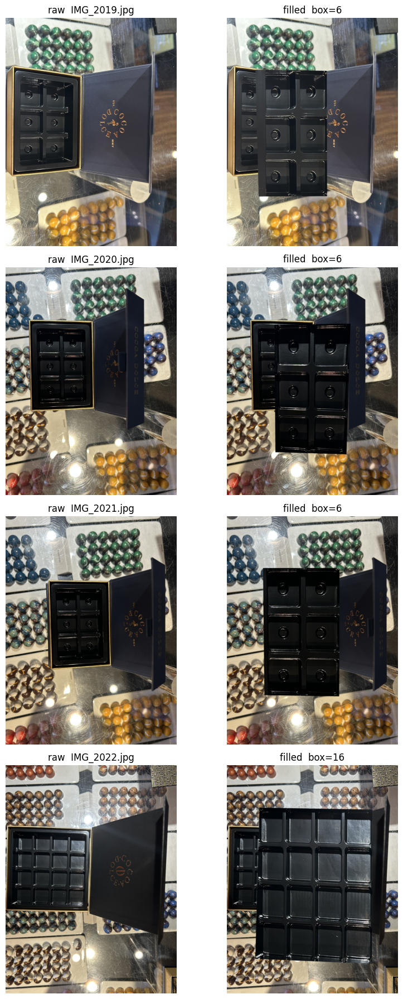

In [ ]:
# Cell 6 — Quick QC of generated outputs
import matplotlib.pyplot as plt

print(f"Total records      : {len(records)}")
print(f"Unique source boxes: {len({r['source_file'] for r in records})}")

# Sanity check: every generated image has the same size as its raw
bad = []
for r in records:
    with Image.open(r["image"]) as im:
        w, h = im.size
    if (w, h) != (r["camera_w"], r["camera_h"]):
        bad.append((r["source_file"], (w, h), (r["camera_w"], r["camera_h"])))
print(f"Size mismatches    : {len(bad)}")
for b in bad[:5]:
    print("   ", b)

# Slots check
for r in records[:8]:
    print(f"  {r['source_file']:>15} | box={r['box_size']:>2} | "
          f"filled={r['n_filled']}/{r['n_slots']}")

# Visual comparison: raw vs filled
n_show = min(4, len(records))
if n_show > 0:
    fig, axes = plt.subplots(n_show, 2, figsize=(9, 4.5 * n_show))
    if n_show == 1:
        axes = axes[None, :]
    for i in range(n_show):
        r = records[i]
        raw = np.asarray(Image.open(BOX_RAW_DIR / r["source_file"]).convert("RGB"))
        fil = np.asarray(Image.open(r["image"]).convert("RGB"))
        axes[i, 0].imshow(raw);  axes[i, 0].set_title(f"raw  {r['source_file']}");  axes[i, 0].axis("off")
        axes[i, 1].imshow(fil);  axes[i, 1].set_title(f"filled  box={r['box_size']}"); axes[i, 1].axis("off")
    plt.tight_layout(); plt.show()

In [ ]:
# Cell 7 — Diagnose synthetic slot image format
import cv2, numpy as np
from PIL import Image

sample_path = synth.iloc[0]["image_path"]
print("Path:", sample_path)

# What cv2 does by default
img_cv = cv2.imread(str(sample_path))
print("cv2 default :", None if img_cv is None else img_cv.shape,
      None if img_cv is None else f"mean={img_cv.mean():.1f}")

# Preserving channels
img_cv4 = cv2.imread(str(sample_path), cv2.IMREAD_UNCHANGED)
print("cv2 unchanged:", None if img_cv4 is None else img_cv4.shape,
      None if img_cv4 is None else f"mean={img_cv4.mean():.1f}")

# PIL view (more informative)
with Image.open(sample_path) as im:
    print("PIL mode:", im.mode, "size:", im.size)
    arr = np.array(im)
    print("PIL array:", arr.shape, arr.dtype)
    if arr.ndim == 3 and arr.shape[2] == 4:
        a = arr[..., 3]
        print(f"  alpha: min={a.min()} max={a.max()} mean={a.mean():.1f} "
              f"frac_zero={(a==0).mean():.2f}")
        # RGB stats inside the opaque region
        m = a > 0
        if m.any():
            print(f"  RGB in opaque: mean={arr[...,:3][m].mean():.1f}")

Path: /homes/mxqasim/Chocolathon/data/synthetic_slots/v1/dataset/images/train/cocoashot_amaretto/cocoashot_amaretto_0001.jpg
cv2 default : (224, 224, 3) mean=22.7
cv2 unchanged: (224, 224, 3) mean=22.7
PIL mode: RGB size: (224, 224)
PIL array: (224, 224, 3) uint8


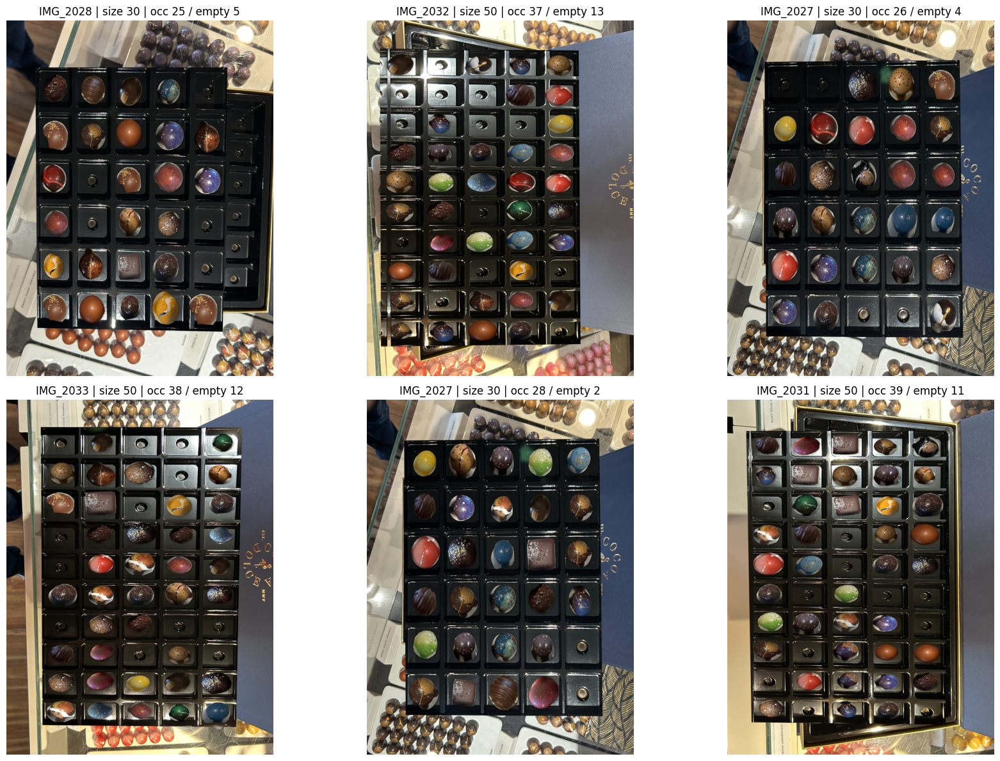

Unreadable images: 0
GT files with duplicate positions: 0

Total slots across test set: 1254
Unique flavors present:       34


,count
label_type,
occupied,1032
empty,222


,count
flavor_id,
truffle_pistachio,46
cocoashot_chocolate_cake,42
truffle_champagne,41
truffle_pumpkin_spice_latte,38
truffle_turtle,38
truffle_confetti_cake,37
truffle_creme_brulee,36
truffle_s_mores,36
truffle_manhattan,35


In [ ]:
# Cell 7 (replacement) — Gallery + sanity checks
n = min(6, len(filled_manifest))
fig, axes = plt.subplots(2, 3, figsize=(18, 12))
for ax, (_, row) in zip(axes.ravel(), filled_manifest.sample(n, random_state=SEED).iterrows()):
    img = np.asarray(Image.open(row["image"]).convert("RGB"))
    ax.imshow(img)
    ax.set_title(f"{Path(row['source_file']).stem} | size {row['box_size']} | "
                 f"occ {row['occupied']} / empty {row['empty']}")
    ax.axis("off")
for ax in axes.ravel()[n:]:
    ax.axis("off")
plt.tight_layout(); plt.show()

# Sanity: every generated image exists and is readable
bad = []
for _, row in filled_manifest.iterrows():
    try:
        _ = np.asarray(Image.open(row["image"]).convert("RGB"))
    except Exception as e:
        bad.append((row["image"], str(e)))
print("Unreadable images:", len(bad))
for b in bad[:5]: print("  ", b)

# Per-position sanity: no duplicated (row, column) in any GT file
dupes = []
for gt in filled_manifest["gt_path"]:
    g = pd.read_csv(gt)
    if g.duplicated(["row", "column"]).any():
        dupes.append(gt)
print("GT files with duplicate positions:", len(dupes))

# Class-balance check
all_gt = pd.concat([pd.read_csv(p) for p in filled_manifest["gt_path"]], ignore_index=True)
print("\nTotal slots across test set:", len(all_gt))
print("Unique flavors present:      ", all_gt["flavor_id"].nunique())
display(all_gt["label_type"].value_counts().rename("count").to_frame())
display(all_gt[all_gt["label_type"] == "occupied"]["flavor_id"].value_counts().rename("count").head(10).to_frame())

In [ ]:
# Cell 8 — Run the pipeline on one synthetic filled box and compare to ground truth
import sys, subprocess, json, tempfile
from pathlib import Path

PIPELINE = PROJECT_ROOT / "pipeline.py"   # <- your saved pipeline file
assert PIPELINE.exists(), f"Place pipeline.py at {PIPELINE}"

# Pick a filled box to test
test_row = filled_manifest.iloc[0]
test_img  = Path(test_row["image"])
test_gt   = Path(test_row["gt_path"])
out_dir   = OUT_ROOT / "pipeline_runs" / test_img.stem
if out_dir.exists():
    import shutil; shutil.rmtree(out_dir)

cmd = [sys.executable, str(PIPELINE),
       "--root", str(PROJECT_ROOT),
       "--image", str(test_img),
       "--out", str(out_dir),
       "--box-size", str(int(test_row["box_size"])),  # we know the truth
       "--threads", "4"]

print("Running:", " ".join(cmd))
proc = subprocess.run(cmd, capture_output=True, text=True)
print("Return code:", proc.returncode)
print(proc.stdout[-2000:])
print(proc.stderr[-2000:])

if proc.returncode == 0:
    result = json.loads((out_dir / "result.json").read_text())
    pred_counts = result["flavor_counts"]

    gt = pd.read_csv(test_gt)
    truth_counts = (gt[gt["label_type"] == "occupied"]
                    .groupby("flavor_id").size().to_dict())

    ids = sorted(set(pred_counts) | set(truth_counts))
    comp = pd.DataFrame({
        "flavor_id": ids,
        "predicted": [pred_counts.get(i, 0) for i in ids],
        "truth":     [truth_counts.get(i, 0) for i in ids],
    })
    comp["delta"] = comp["predicted"] - comp["truth"]
    print("\nPer-flavor comparison:")
    display(comp)
    print("\nTotal predicted:", sum(pred_counts.values()))
    print("Total truth:    ", sum(truth_counts.values()))
    print("Review slots:   ", result["review_slots"])
else:
    print("Pipeline failed; see stderr above.")

Running: /homes/mxqasim/Chocolathon/.venv/bin/python /homes/mxqasim/Chocolathon/pipeline.py --root /homes/mxqasim/Chocolathon --image /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v1/images/IMG_2019_size6_v00.jpg --out /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v1/pipeline_runs/IMG_2019_size6_v00 --box-size 6 --threads 4
Return code: 2

/homes/mxqasim/Chocolathon/.venv/lib64/python3.9/site-packages/networkx/utils/backends.py:135: RuntimeWarning: networkx backend defined more than once: nx-loopback
  backends.update(_get_backends("networkx.backends"))
ERROR: Auto tray detection failed. Provide --corners corners.json (run --dump-template for the format).

Hint: run  python pipeline.py --image /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v1/images/IMG_2019_size6_v00.jpg --out /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v1/pipeline_runs/IMG_2019_size6_v00 --dump-template corners.json

Pipeline failed; see stderr above.


## New code from GPT

In [50]:
from pathlib import Path
import json
import random
import cv2
import numpy as np
import pandas as pd
from PIL import Image, ImageOps

SEED = 42
N_PER_BOX = 3
CELL = 256

random.seed(SEED)
np.random.seed(SEED)

ROOT = Path("/homes/mxqasim/Chocolathon")

SYNTH_MANIFEST = ROOT / "data/synthetic_slots/v1/dataset/synthetic_slot_manifest.csv"
EMPTY_MANIFEST = ROOT / "data/boxes/slots/empty_slots_manifest.csv"
BOX_MANIFEST = ROOT / "data/boxes/manifest.csv"
RAW_DIR = ROOT / "data/boxes/raw"

OUT_ROOT = ROOT / "data/synthetic_filled_boxes/v3"
IMAGE_DIR = OUT_ROOT / "images"
GT_DIR = OUT_ROOT / "ground_truth"

OUT_ROOT.mkdir(parents=True, exist_ok=True)
IMAGE_DIR.mkdir(parents=True, exist_ok=True)
GT_DIR.mkdir(parents=True, exist_ok=True)

LAYOUTS = {6: (3, 2), 16: (4, 4), 30: (6, 5), 50: (10, 5)}
CORNERS = ["top_left", "top_right", "bottom_right", "bottom_left"]

synth = pd.read_csv(SYNTH_MANIFEST)
empty = pd.read_csv(EMPTY_MANIFEST)
boxes = pd.read_csv(BOX_MANIFEST)

synth["image_path"] = synth["relative_path"].map(lambda p: ROOT / p)

assert len(synth) == 3718
assert len(empty) == 418
assert len(boxes) == 16
assert synth["image_path"].map(Path.exists).all()

empty_lookup = {
    row.slot_file: (int(row.row), int(row.column))
    for row in empty.itertuples()
}

assert len(empty_lookup) == len(empty)

print("Synthetic slot samples:", len(synth))
print("Empty slots:", len(empty))
print("Source boxes:", len(boxes))
print("Output directory:", OUT_ROOT)

Synthetic slot samples: 3718
Empty slots: 418
Source boxes: 16
Output directory: /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v3


In [51]:
def load_json(path):
    with open(path, encoding="utf-8") as f:
        return json.load(f)


def load_oriented_rgb(path):
    return np.asarray(
        ImageOps.exif_transpose(
            Image.open(path)
        ).convert("RGB")
    )


def get_outer_box_corners(box_row):
    annotation = load_json(box_row.annotation_file)
    raw_path = RAW_DIR / box_row.file
    raw_image = ImageOps.exif_transpose(Image.open(raw_path)).convert("RGB")

    raw_w, raw_h = raw_image.size
    annotation_w = int(annotation["image_width"])
    annotation_h = int(annotation["image_height"])

    if (raw_w, raw_h) != (annotation_w, annotation_h):
        raise ValueError(
            f"Image/annotation mismatch for {box_row.file}: "
            f"image={(raw_w, raw_h)}, annotation={(annotation_w, annotation_h)}"
        )

    corners = np.asarray(
        [annotation["corners"][name] for name in CORNERS],
        dtype=np.float32
    )

    if corners.shape != (4, 2):
        raise ValueError(f"Invalid corner shape for {box_row.file}")

    if not np.isfinite(corners).all():
        raise ValueError(f"Non-finite corners for {box_row.file}")

    if np.any(corners[:, 0] < 0) or np.any(corners[:, 0] >= raw_w):
        raise ValueError(f"Invalid x-coordinates for {box_row.file}")

    if np.any(corners[:, 1] < 0) or np.any(corners[:, 1] >= raw_h):
        raise ValueError(f"Invalid y-coordinates for {box_row.file}")

    return corners, (raw_w, raw_h)


def stitch_slots(slot_rows, box_size):
    rows, columns = LAYOUTS[box_size]
    tray = np.full(
        (rows * CELL, columns * CELL, 3),
        28,
        dtype=np.uint8
    )

    placed = []

    for row in slot_rows.itertuples():
        if row.empty_slot_file not in empty_lookup:
            raise ValueError(f"Unknown slot: {row.empty_slot_file}")

        grid_row, grid_column = empty_lookup[row.empty_slot_file]
        tray_row = grid_row - 1
        tray_column = grid_column - 1

        if not (0 <= tray_row < rows and 0 <= tray_column < columns):
            raise ValueError(
                f"Invalid position ({grid_row}, {grid_column}) "
                f"for box size {box_size}"
            )

        slot = load_oriented_rgb(row.image_path)
        slot = cv2.resize(
            slot,
            (CELL, CELL),
            interpolation=cv2.INTER_AREA
        )

        y1, y2 = tray_row * CELL, (tray_row + 1) * CELL
        x1, x2 = tray_column * CELL, (tray_column + 1) * CELL
        tray[y1:y2, x1:x2] = slot

        placed.append({
            "row": grid_row,
            "column": grid_column,
            "slot_file": row.empty_slot_file,
            "sample_id": row.sample_id,
            "flavor_id": row.flavor_id,
            "flavor_name": row.flavor_name,
            "image_path": str(row.image_path)
        })

    expected_slots = rows * columns
    positions = {(x["row"], x["column"]) for x in placed}

    if len(placed) != expected_slots:
        raise ValueError(
            f"Expected {expected_slots} slots, got {len(placed)}"
        )

    if len(positions) != expected_slots:
        raise ValueError("Duplicate or missing slot positions")

    return tray, placed


def warp_tray_to_camera(raw_rgb, tray_rgb, corners):
    tray_height, tray_width = tray_rgb.shape[:2]
    raw_height, raw_width = raw_rgb.shape[:2]

    source_points = np.float32([
        [0, 0],
        [tray_width - 1, 0],
        [tray_width - 1, tray_height - 1],
        [0, tray_height - 1]
    ])

    destination_points = corners.astype(np.float32)

    matrix = cv2.getPerspectiveTransform(
        source_points,
        destination_points
    )

    warped = cv2.warpPerspective(
        tray_rgb,
        matrix,
        (raw_width, raw_height),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(0, 0, 0)
    )

    mask = np.full(
        (tray_height, tray_width),
        255,
        dtype=np.uint8
    )

    mask = cv2.warpPerspective(
        mask,
        matrix,
        (raw_width, raw_height),
        flags=cv2.INTER_NEAREST
    )

    mask = cv2.erode(
        mask,
        np.ones((5, 5), dtype=np.uint8),
        iterations=1
    )

    mask = cv2.GaussianBlur(mask, (11, 11), 0)
    alpha = (mask.astype(np.float32) / 255.0)[..., None]

    output = (
        raw_rgb.astype(np.float32) * (1.0 - alpha)
        + warped.astype(np.float32) * alpha
    )

    return np.clip(output, 0, 255).astype(np.uint8)

In [52]:
records = []
ground_truth_rows = []

for box in boxes.itertuples():
    source_file = box.file
    box_size = int(box.box_size)
    rows, columns = LAYOUTS[box_size]
    expected_slots = rows * columns

    source_slots = synth[
        synth["empty_source_file"].eq(source_file)
    ].copy()

    groups = {
        slot_file: group.sort_values(
            ["seed", "sample_id"]
        ).reset_index(drop=True)
        for slot_file, group in source_slots.groupby(
            "empty_slot_file"
        )
    }

    if len(groups) != expected_slots:
        raise ValueError(
            f"{source_file}: expected {expected_slots} slot groups, "
            f"found {len(groups)}"
        )

    raw_rgb = load_oriented_rgb(RAW_DIR / source_file)
    corners, _ = get_outer_box_corners(box)

    for render_index in range(N_PER_BOX):
        selected_rows = []

        for slot_file in sorted(groups):
            group = groups[slot_file]
            selected_rows.append(
                group.iloc[render_index % len(group)]
            )

        selected = pd.DataFrame(selected_rows)

        tray, placed = stitch_slots(selected, box_size)
        filled = warp_tray_to_camera(
            raw_rgb,
            tray,
            corners
        )

        stem = Path(source_file).stem
        name = f"{stem}_size{box_size}_render{render_index:02d}"

        image_path = IMAGE_DIR / f"{name}.jpg"
        gt_path = GT_DIR / f"{name}.csv"

        Image.fromarray(filled).save(
            image_path,
            format="JPEG",
            quality=95
        )

        gt = pd.DataFrame(placed)
        gt.insert(0, "image", str(image_path))
        gt.insert(1, "source_file", source_file)
        gt.insert(2, "box_size", box_size)
        gt.insert(3, "render_index", render_index)
        gt["label_type"] = "occupied"

        gt.to_csv(gt_path, index=False)

        records.append({
            "image": str(image_path),
            "gt_path": str(gt_path),
            "source_file": source_file,
            "box_size": box_size,
            "render_index": render_index,
            "slots": len(gt),
            "occupied": len(gt),
            "empty": 0,
            "corners": json.dumps(corners.tolist())
        })

manifest = pd.DataFrame(records)
manifest_path = OUT_ROOT / "manifest.csv"
manifest.to_csv(manifest_path, index=False)

print("Generated images:", len(manifest))
print("Expected images:", len(boxes) * N_PER_BOX)
print("Generated slots:", int(manifest["slots"].sum()))
print("Manifest:", manifest_path)

Generated images: 48
Expected images: 48
Generated slots: 1254
Manifest: /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v3/manifest.csv


In [53]:
manifest = pd.read_csv(OUT_ROOT / "manifest.csv")

assert len(manifest) == len(boxes) * N_PER_BOX
assert manifest["image"].map(lambda p: Path(p).exists()).all()
assert manifest["gt_path"].map(lambda p: Path(p).exists()).all()

for row in manifest.itertuples():
    image = Image.open(row.image)
    gt = pd.read_csv(row.gt_path)

    expected_slots = LAYOUTS[int(row.box_size)][0] * LAYOUTS[int(row.box_size)][1]

    assert image.size == (3024, 4032)
    assert len(gt) == expected_slots
    assert not gt.duplicated(["row", "column"]).any()
    assert gt["flavor_id"].notna().all()
    assert set(gt["label_type"]) == {"occupied"}

print("PASS: all generated boxes are valid")
print()
print(manifest.groupby("box_size").size().rename("images"))
print()
print(manifest.groupby("box_size")["slots"].sum().rename("slots"))

PASS: all generated boxes are valid

box_size
6      9
16    15
30    12
50    12
Name: images, dtype: int64

box_size
6      54
16    240
30    360
50    600
Name: slots, dtype: int64


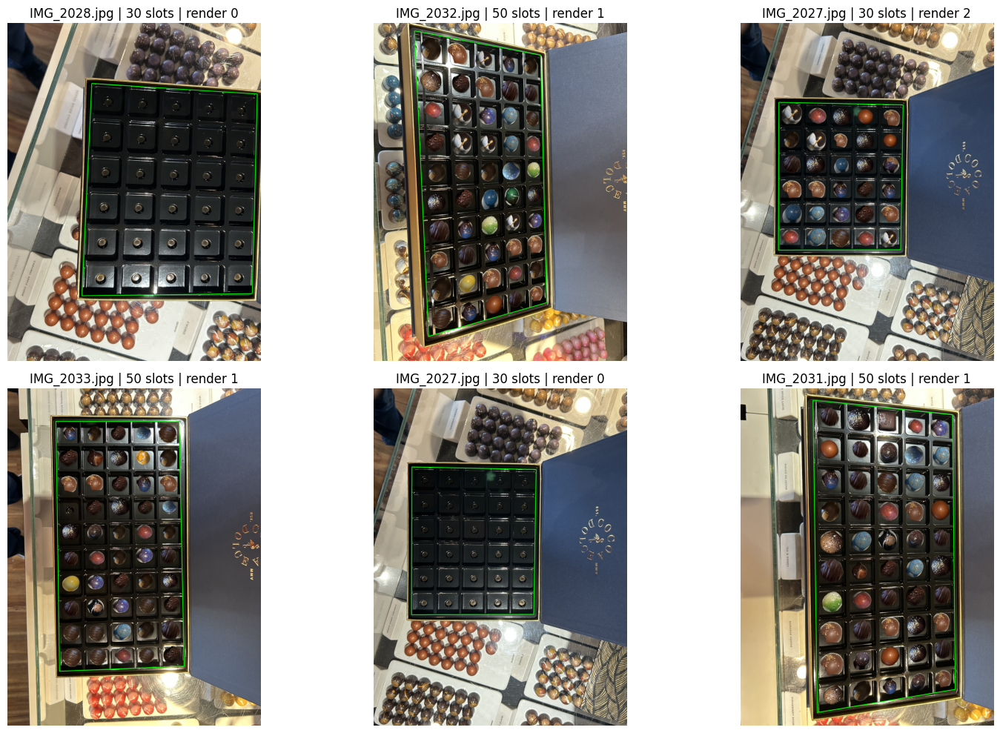

In [54]:
import matplotlib.pyplot as plt

sample = manifest.sample(
    min(6, len(manifest)),
    random_state=SEED
)

fig, axes = plt.subplots(2, 3, figsize=(16, 10))
axes = np.asarray(axes).ravel()

for axis, row in zip(axes, sample.itertuples()):
    image = np.asarray(
        Image.open(row.image).convert("RGB")
    )

    corners = np.asarray(
        json.loads(row.corners),
        dtype=np.int32
    )

    preview = image.copy()
    cv2.polylines(
        preview,
        [corners],
        isClosed=True,
        color=(0, 255, 0),
        thickness=8
    )

    axis.imshow(preview)
    axis.set_title(
        f"{row.source_file} | {row.box_size} slots | "
        f"render {row.render_index}"
    )
    axis.axis("off")

for axis in axes[len(sample):]:
    axis.axis("off")

plt.tight_layout()
plt.show()

## Gpt code 

In [4]:
from pathlib import Path
import json, random
import cv2
import numpy as np
import pandas as pd
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

SEED, N_PER_BOX, CELL = 42, 3, 256
random.seed(SEED)
np.random.seed(SEED)

ROOT = Path("/homes/mxqasim/Chocolathon")
SYNTH_MANIFEST = ROOT / "data/synthetic_slots/v1/dataset/synthetic_slot_manifest.csv"
EMPTY_MANIFEST = ROOT / "data/boxes/slots/empty_slots_manifest.csv"
BOX_MANIFEST = ROOT / "data/boxes/manifest.csv"
RAW_DIR = ROOT / "data/boxes/raw"

OUT_ROOT = ROOT / "data/synthetic_filled_boxes/v4"
IMAGE_DIR = OUT_ROOT / "images"
GT_DIR = OUT_ROOT / "ground_truth"
MANIFEST_PATH = OUT_ROOT / "manifest.csv"

IMAGE_DIR.mkdir(parents=True, exist_ok=True)
GT_DIR.mkdir(parents=True, exist_ok=True)

LAYOUTS = {6: (3, 2), 16: (4, 4), 30: (6, 5), 50: (10, 5)}
CORNER_NAMES = ("top_left", "top_right", "bottom_right", "bottom_left")

for path in [SYNTH_MANIFEST, EMPTY_MANIFEST, BOX_MANIFEST, RAW_DIR]:
    assert path.exists(), f"Missing input: {path}"

synth = pd.read_csv(SYNTH_MANIFEST)
empty = pd.read_csv(EMPTY_MANIFEST)
boxes = pd.read_csv(BOX_MANIFEST)

required_synth = {
    "relative_path", "empty_source_file", "empty_slot_file",
    "sample_id", "flavor_id", "flavor_name", "seed"
}
required_empty = {"slot_file", "source_file", "box_size", "row", "column"}
required_boxes = {"file", "box_size", "annotation_file"}

assert required_synth.issubset(synth.columns), required_synth - set(synth.columns)
assert required_empty.issubset(empty.columns), required_empty - set(empty.columns)
assert required_boxes.issubset(boxes.columns), required_boxes - set(boxes.columns)

print("Synthetic samples before filtering:", len(synth))

synth["flavor_id"] = synth["flavor_id"].astype(str).str.strip()
occupied_mask = synth["flavor_id"].str.lower().ne("empty")

if "label_type" in synth.columns:
    synth["label_type"] = synth["label_type"].astype(str).str.strip().str.lower()
    occupied_mask &= synth["label_type"].eq("occupied")

removed_count = int((~occupied_mask).sum())
synth = synth.loc[occupied_mask].copy().reset_index(drop=True)

print("Synthetic samples after filtering:", len(synth))
print("Removed empty samples:", removed_count)

assert not synth["flavor_id"].str.lower().eq("empty").any()

if "label_type" in synth.columns:
    assert synth["label_type"].eq("occupied").all()

def project_path(value):
    path = Path(str(value))
    return path if path.is_absolute() else ROOT / path

synth["image_path"] = synth["relative_path"].map(project_path)
missing_images = synth.loc[~synth["image_path"].map(Path.exists), "image_path"]
assert missing_images.empty, f"Missing synthetic images:\n{missing_images.head()}"

assert len(empty) == 418
assert len(boxes) == 16

empty_lookup = {
    row.slot_file: (int(row.row), int(row.column))
    for row in empty.itertuples()
}

assert len(empty_lookup) == len(empty), "Duplicate slot_file values found"

# Find positions that lost all candidates after removing empty samples
missing_occupied_positions = []

for box in boxes.itertuples():
    target_slots = empty[
        empty["source_file"].eq(box.file)
    ][["slot_file", "row", "column"]]

    available = set(
        synth.loc[
            synth["empty_source_file"].eq(box.file),
            "empty_slot_file"
        ]
    )

    for slot in target_slots.itertuples():
        if slot.slot_file not in available:
            missing_occupied_positions.append({
                "source_file": box.file,
                "box_size": int(box.box_size),
                "slot_file": slot.slot_file,
                "row": int(slot.row),
                "column": int(slot.column)
            })

missing_occupied_positions = pd.DataFrame(missing_occupied_positions)

print("\nPositions needing compatible occupied donors:")
display(missing_occupied_positions)

# Confirm another box of the same capacity has donors at each missing position
for item in missing_occupied_positions.itertuples():
    donor_slot_files = empty.loc[
        empty["box_size"].astype(int).eq(item.box_size)
        & empty["row"].astype(int).eq(item.row)
        & empty["column"].astype(int).eq(item.column)
        & ~empty["source_file"].eq(item.source_file),
        "slot_file"
    ]

    donor_samples = synth[
        synth["empty_slot_file"].isin(donor_slot_files)
    ]

    assert not donor_samples.empty, (
        f"No donor for {item.source_file}, "
        f"row={item.row}, column={item.column}"
    )

print("\nPASS: setup and occupied-sample validation")
print("Occupied samples:", len(synth))
print("Empty-slot positions:", len(empty_lookup))
print("Source boxes:", len(boxes))
print("Output directory:", OUT_ROOT)

Synthetic samples before filtering: 3718
Synthetic samples after filtering: 3300
Removed empty samples: 418

Positions needing compatible occupied donors:


,source_file,box_size,slot_file,row,column
0,IMG_2033.jpg,50,IMG_2033_r04_c01.jpg,4,1
1,IMG_2034.jpg,50,IMG_2034_r02_c05.jpg,2,5



PASS: setup and occupied-sample validation
Occupied samples: 3300
Empty-slot positions: 418
Source boxes: 16
Output directory: /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v4


In [5]:
def load_json(path):
    path = project_path(path)
    with path.open(encoding="utf-8") as file:
        return json.load(file)


def load_oriented_rgb(path, background=(28, 28, 28)):
    path = project_path(path)

    with Image.open(path) as image:
        image = ImageOps.exif_transpose(image)

        if image.mode in {"RGBA", "LA"} or "transparency" in image.info:
            rgba = image.convert("RGBA")
            canvas = Image.new("RGBA", rgba.size, (*background, 255))
            canvas.alpha_composite(rgba)
            image = canvas.convert("RGB")
        else:
            image = image.convert("RGB")

        return np.asarray(image)


def get_outer_box_corners(box_row):
    raw_rgb = load_oriented_rgb(RAW_DIR / box_row.file)
    annotation = load_json(box_row.annotation_file)
    raw_height, raw_width = raw_rgb.shape[:2]
    annotation_size = (
        int(annotation["image_width"]),
        int(annotation["image_height"])
    )

    if (raw_width, raw_height) != annotation_size:
        raise ValueError(
            f"{box_row.file}: image size {(raw_width, raw_height)} "
            f"!= annotation size {annotation_size}"
        )

    corners = np.asarray(
        [annotation["corners"][name] for name in CORNER_NAMES],
        dtype=np.float32
    )

    if corners.shape != (4, 2):
        raise ValueError(f"{box_row.file}: invalid corner shape {corners.shape}")

    if not np.isfinite(corners).all():
        raise ValueError(f"{box_row.file}: non-finite corner coordinates")

    if (
        np.any(corners[:, 0] < 0)
        or np.any(corners[:, 0] >= raw_width)
        or np.any(corners[:, 1] < 0)
        or np.any(corners[:, 1] >= raw_height)
    ):
        raise ValueError(f"{box_row.file}: corners exceed image bounds")

    if not cv2.isContourConvex(corners):
        raise ValueError(f"{box_row.file}: corner polygon is not convex")

    if abs(cv2.contourArea(corners)) < 100:
        raise ValueError(f"{box_row.file}: tray polygon is too small")

    return raw_rgb, corners


def stitch_slots(slot_rows, box_size):
    rows, columns = LAYOUTS[box_size]
    tray = np.full((rows * CELL, columns * CELL, 3), 28, dtype=np.uint8)
    placed = []

    for sample in slot_rows.itertuples():
        flavor_id = str(sample.flavor_id).strip()

        if flavor_id.lower() == "empty":
            raise ValueError(f"Empty sample selected: {sample.sample_id}")

        if sample.empty_slot_file not in empty_lookup:
            raise ValueError(f"Unknown slot: {sample.empty_slot_file}")

        grid_row, grid_column = empty_lookup[sample.empty_slot_file]
        tray_row, tray_column = grid_row - 1, grid_column - 1

        if not (0 <= tray_row < rows and 0 <= tray_column < columns):
            raise ValueError(
                f"Invalid position {(grid_row, grid_column)} "
                f"for capacity {box_size}"
            )

        slot = load_oriented_rgb(sample.image_path)
        interpolation = (
            cv2.INTER_AREA
            if slot.shape[0] > CELL or slot.shape[1] > CELL
            else cv2.INTER_CUBIC
        )
        slot = cv2.resize(slot, (CELL, CELL), interpolation=interpolation)

        y1, y2 = tray_row * CELL, (tray_row + 1) * CELL
        x1, x2 = tray_column * CELL, (tray_column + 1) * CELL
        tray[y1:y2, x1:x2] = slot

        placed.append({
            "row": grid_row,
            "column": grid_column,
            "slot_file": sample.empty_slot_file,
            "sample_id": sample.sample_id,
            "flavor_id": flavor_id,
            "flavor_name": sample.flavor_name,
            "label_type": "occupied",
            "image_path": str(sample.image_path)
        })

    expected = rows * columns
    positions = {(item["row"], item["column"]) for item in placed}

    if len(placed) != expected:
        raise ValueError(f"Expected {expected} slots, found {len(placed)}")

    if len(positions) != expected:
        raise ValueError("Duplicate or missing tray positions")

    return tray, placed


def warp_tray_to_camera(raw_rgb, tray_rgb, corners):
    tray_height, tray_width = tray_rgb.shape[:2]
    raw_height, raw_width = raw_rgb.shape[:2]

    source = np.float32([
        [0, 0],
        [tray_width - 1, 0],
        [tray_width - 1, tray_height - 1],
        [0, tray_height - 1]
    ])

    matrix = cv2.getPerspectiveTransform(
        source,
        corners.astype(np.float32)
    )

    warped = cv2.warpPerspective(
        tray_rgb,
        matrix,
        (raw_width, raw_height),
        flags=cv2.INTER_LINEAR,
        borderMode=cv2.BORDER_CONSTANT,
        borderValue=(0, 0, 0)
    )

    tray_mask = np.full(
        (tray_height, tray_width),
        255,
        dtype=np.uint8
    )

    mask = cv2.warpPerspective(
        tray_mask,
        matrix,
        (raw_width, raw_height),
        flags=cv2.INTER_NEAREST
    )

    mask = cv2.erode(
        mask,
        np.ones((5, 5), dtype=np.uint8),
        iterations=1
    )

    mask = cv2.GaussianBlur(mask, (11, 11), 0)
    alpha = (mask.astype(np.float32) / 255.0)[..., None]

    output = (
        raw_rgb.astype(np.float32) * (1.0 - alpha)
        + warped.astype(np.float32) * alpha
    )

    return np.clip(output, 0, 255).astype(np.uint8)


print("PASS: rendering helpers are ready")

PASS: rendering helpers are ready


In [6]:
records = []
failures = []
borrowed_positions = []

for box in boxes.itertuples():
    source_file = box.file
    box_size = int(box.box_size)
    rows, columns = LAYOUTS[box_size]
    expected_slots = rows * columns

    source_slots = synth[
        synth["empty_source_file"].eq(source_file)
    ].copy()

    target_slots = empty[
        empty["source_file"].eq(source_file)
    ][["slot_file", "row", "column"]].copy()

    if len(target_slots) != expected_slots:
        failures.append({
            "source_file": source_file,
            "reason": (
                f"expected {expected_slots} target positions, "
                f"found {len(target_slots)}"
            )
        })
        continue

    groups = {}

    for target in target_slots.itertuples():
        group = source_slots[
            source_slots["empty_slot_file"].eq(target.slot_file)
        ].copy()

        # Borrow from the same capacity and grid position when this
        # source box has no occupied sample for the position.
        if group.empty:
            donor_slot_files = empty.loc[
                empty["box_size"].astype(int).eq(box_size)
                & empty["row"].astype(int).eq(int(target.row))
                & empty["column"].astype(int).eq(int(target.column))
                & ~empty["source_file"].eq(source_file),
                "slot_file"
            ]

            group = synth[
                synth["empty_slot_file"].isin(donor_slot_files)
            ].copy()

            if group.empty:
                failures.append({
                    "source_file": source_file,
                    "reason": (
                        f"no occupied donor for row={target.row}, "
                        f"column={target.column}"
                    )
                })
                continue

            group["donor_slot_file"] = group["empty_slot_file"]
            group["donor_source_file"] = group["empty_source_file"]

            # Assign donor samples to the missing target position
            group["empty_slot_file"] = target.slot_file
            group["empty_source_file"] = source_file

            borrowed_positions.append({
                "source_file": source_file,
                "box_size": box_size,
                "target_slot_file": target.slot_file,
                "row": int(target.row),
                "column": int(target.column),
                "donor_candidates": len(group)
            })
        else:
            group["donor_slot_file"] = group["empty_slot_file"]
            group["donor_source_file"] = group["empty_source_file"]

        groups[target.slot_file] = group.sort_values(
            ["seed", "sample_id"]
        ).reset_index(drop=True)

    if len(groups) != expected_slots:
        failures.append({
            "source_file": source_file,
            "reason": (
                f"expected {expected_slots} completed groups, "
                f"found {len(groups)}"
            )
        })
        continue

    raw_rgb, corners = get_outer_box_corners(box)

    for render_index in range(N_PER_BOX):
        try:
            selected_rows = [
                groups[slot_file].iloc[
                    render_index % len(groups[slot_file])
                ]
                for slot_file in sorted(groups)
            ]

            selected = pd.DataFrame(selected_rows)

            assert len(selected) == expected_slots
            assert not selected["flavor_id"].astype(
                str
            ).str.lower().eq("empty").any()

            tray, placed = stitch_slots(selected, box_size)
            filled = warp_tray_to_camera(raw_rgb, tray, corners)

            stem = Path(source_file).stem
            name = (
                f"{stem}_size{box_size}_"
                f"render{render_index:02d}"
            )

            image_path = IMAGE_DIR / f"{name}.jpg"
            gt_path = GT_DIR / f"{name}.csv"

            Image.fromarray(filled).save(
                image_path,
                format="JPEG",
                quality=95,
                subsampling=0
            )

            gt = pd.DataFrame(placed)
            gt.insert(0, "image", str(image_path))
            gt.insert(1, "source_file", source_file)
            gt.insert(2, "box_size", box_size)
            gt.insert(3, "render_index", render_index)

            assert len(gt) == expected_slots
            assert set(gt["label_type"]) == {"occupied"}
            assert not gt["flavor_id"].astype(
                str
            ).str.lower().eq("empty").any()

            gt.to_csv(gt_path, index=False)

            records.append({
                "image": str(image_path),
                "gt_path": str(gt_path),
                "source_file": source_file,
                "box_size": box_size,
                "render_index": render_index,
                "slots": expected_slots,
                "occupied": expected_slots,
                "empty": 0,
                "corners": json.dumps(corners.tolist())
            })

        except Exception as error:
            failures.append({
                "source_file": source_file,
                "render_index": render_index,
                "reason": repr(error)
            })

if borrowed_positions:
    print("Borrowed occupied samples:")
    display(
        pd.DataFrame(borrowed_positions)
        .drop_duplicates(
            ["source_file", "target_slot_file"]
        )
        .reset_index(drop=True)
    )

if failures:
    display(pd.DataFrame(failures))
    raise RuntimeError(
        f"Generation failed for {len(failures)} item(s)"
    )

manifest = pd.DataFrame(records)
manifest.to_csv(MANIFEST_PATH, index=False)

print("Generated images:", len(manifest))
print("Expected images:", len(boxes) * N_PER_BOX)
print("Generated slots:", int(manifest["slots"].sum()))
print("Manifest:", MANIFEST_PATH)

Borrowed occupied samples:


,source_file,box_size,target_slot_file,row,column,donor_candidates
0,IMG_2033.jpg,50,IMG_2033_r04_c01.jpg,4,1,11
1,IMG_2034.jpg,50,IMG_2034_r02_c05.jpg,2,5,14


Generated images: 48
Expected images: 48
Generated slots: 1254
Manifest: /homes/mxqasim/Chocolathon/data/synthetic_filled_boxes/v4/manifest.csv


In [7]:
manifest = pd.read_csv(MANIFEST_PATH)

expected_images = len(boxes) * N_PER_BOX
expected_by_capacity = {
    capacity: int(
        boxes["box_size"].astype(int).eq(capacity).sum()
        * N_PER_BOX
    )
    for capacity in LAYOUTS
}

assert len(manifest) == expected_images
assert manifest["image"].map(lambda p: Path(p).exists()).all()
assert manifest["gt_path"].map(lambda p: Path(p).exists()).all()
assert manifest["empty"].eq(0).all()
assert manifest["occupied"].eq(manifest["box_size"]).all()
assert manifest["slots"].eq(manifest["box_size"]).all()

validation_errors = []
total_slots = 0

for item in manifest.itertuples():
    image_path = Path(item.image)
    gt_path = Path(item.gt_path)

    with Image.open(image_path) as generated:
        generated_size = ImageOps.exif_transpose(generated).size

    with Image.open(RAW_DIR / item.source_file) as source:
        source_size = ImageOps.exif_transpose(source).size

    gt = pd.read_csv(gt_path)
    box_size = int(item.box_size)
    rows, columns = LAYOUTS[box_size]
    expected_slots = rows * columns
    total_slots += len(gt)

    if generated_size != source_size:
        validation_errors.append(
            f"{image_path.name}: image size mismatch"
        )

    if len(gt) != expected_slots:
        validation_errors.append(
            f"{gt_path.name}: expected {expected_slots} slots, "
            f"found {len(gt)}"
        )

    if gt.duplicated(["row", "column"]).any():
        validation_errors.append(
            f"{gt_path.name}: duplicate grid positions"
        )

    expected_positions = {
        (row, column)
        for row in range(1, rows + 1)
        for column in range(1, columns + 1)
    }

    actual_positions = set(
        zip(
            gt["row"].astype(int),
            gt["column"].astype(int)
        )
    )

    if actual_positions != expected_positions:
        validation_errors.append(
            f"{gt_path.name}: missing or invalid positions"
        )

    if gt["flavor_id"].isna().any():
        validation_errors.append(
            f"{gt_path.name}: missing flavor IDs"
        )

    if gt["flavor_id"].astype(str).str.lower().eq("empty").any():
        validation_errors.append(
            f"{gt_path.name}: contains empty flavor IDs"
        )

    if not gt["label_type"].astype(str).str.lower().eq("occupied").all():
        validation_errors.append(
            f"{gt_path.name}: contains non-occupied labels"
        )

    corners = np.asarray(
        json.loads(item.corners),
        dtype=np.float32
    )

    if corners.shape != (4, 2):
        validation_errors.append(
            f"{image_path.name}: invalid corners"
        )

assert not validation_errors, "\n".join(validation_errors)

image_counts = (
    manifest.groupby("box_size")
    .size()
    .astype(int)
    .to_dict()
)

assert image_counts == expected_by_capacity

expected_total_slots = sum(
    int(capacity) * image_count
    for capacity, image_count in image_counts.items()
)

assert total_slots == expected_total_slots

print("PASS: all generated boxes are completely filled")
print("Images:", len(manifest))
print("Slots:", total_slots)

print("\nImages by capacity:")
print(
    manifest.groupby("box_size")
    .size()
    .rename("images")
)

print("\nSlots by capacity:")
print(
    manifest.groupby("box_size")["slots"]
    .sum()
    .rename("slots")
)

PASS: all generated boxes are completely filled
Images: 48
Slots: 1254

Images by capacity:
box_size
6      9
16    15
30    12
50    12
Name: images, dtype: int64

Slots by capacity:
box_size
6      54
16    240
30    360
50    600
Name: slots, dtype: int64


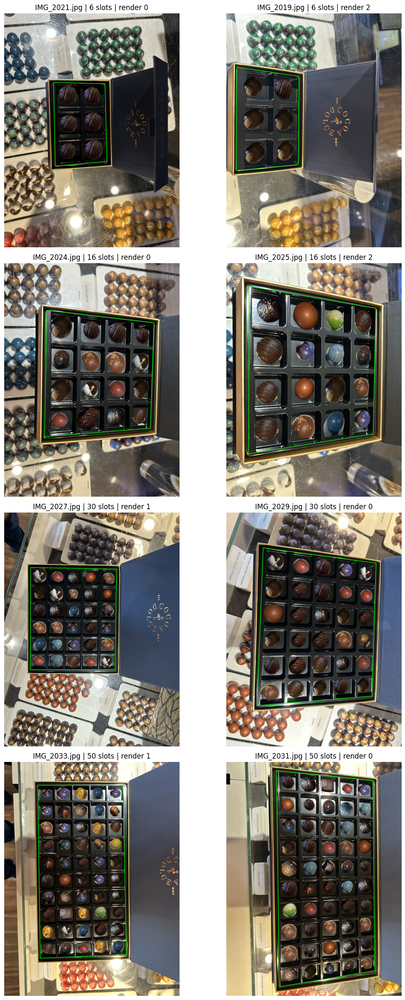

In [8]:
sample_parts = []

for box_size in sorted(LAYOUTS):
    capacity_rows = manifest[
        manifest["box_size"].astype(int).eq(box_size)
    ]

    sample_parts.append(
        capacity_rows.sample(
            n=min(2, len(capacity_rows)),
            random_state=SEED + box_size
        )
    )

sample = pd.concat(
    sample_parts,
    ignore_index=True
)

columns = 2
rows = int(np.ceil(len(sample) / columns))

fig, axes = plt.subplots(
    rows,
    columns,
    figsize=(12, 6 * rows)
)

axes = np.atleast_1d(axes).ravel()

for axis, item in zip(axes, sample.itertuples()):
    image = np.asarray(
        Image.open(item.image).convert("RGB")
    )

    corners = np.asarray(
        json.loads(item.corners),
        dtype=np.int32
    )

    preview = image.copy()

    cv2.polylines(
        preview,
        [corners],
        isClosed=True,
        color=(0, 255, 0),
        thickness=8
    )

    axis.imshow(preview)
    axis.set_title(
        f"{item.source_file} | {item.box_size} slots | "
        f"render {item.render_index}"
    )
    axis.axis("off")

for axis in axes[len(sample):]:
    axis.axis("off")

plt.tight_layout()
plt.show()